In [6]:
# https://www.data.go.kr/data/15083033/fileData.do

import folium

# 위도
latitude = 37.394946
# 경도
longitude = 127.111104

m = folium.Map(location=[latitude, longitude],
               zoom_start=17, 
               width=750, 
               height=500
              )
#m

In [7]:
folium.Marker([latitude, longitude],
              popup="판교역",
              tooltip="판교역 입구", 
              icon=folium.Icon('red', icon='star'),
             ).add_to(m)

folium.CircleMarker([latitude, longitude],
                    color='tomato',
                    radius = 50, 
                    tooltip='판교역 상권').add_to(m)

m

In [10]:
import pandas as pd

df = pd.read_csv('소상공인시장진흥공단_상가(상권)정보_서울_202206.csv', encoding='cp949')
df.head(3)

#pd.Series(df.columns)

0        상가업소번호
1           상호명
2           지점명
3     상권업종대분류코드
4      상권업종대분류명
5     상권업종중분류코드
6      상권업종중분류명
7     상권업종소분류코드
8      상권업종소분류명
9      표준산업분류코드
10      표준산업분류명
11         시도코드
12          시도명
13        시군구코드
14         시군구명
15        행정동코드
16         행정동명
17        법정동코드
18         법정동명
19         지번코드
20       대지구분코드
21        대지구분명
22        지번본번지
23        지번부번지
24         지번주소
25        도로명코드
26          도로명
27        건물본번지
28        건물부번지
29       건물관리번호
30          건물명
31        도로명주소
32        구우편번호
33        신우편번호
34          동정보
35          층정보
36          호정보
37           경도
38           위도
dtype: object

In [11]:
sub_df = df.loc[df['행정동명'].isin(['신당동', '한남동', '공덕동'])]
sub_df.head(3)

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
15,17175285,은진이네,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,1.144010e+24,고려아카데미텔,서울특별시 마포구 마포대로 196,121861,4206.0,NaN,NaN,NaN,126.956164,37.551340
54,24117023,까르떼,NaN,D,소매,D06,가방/신발/액세서리,D06A10,가방/가죽제품소매,G47430,...,1.114020e+24,누죤빌딩,서울특별시 중구 을지로45길 62,100822,4566.0,NaN,4,NaN,127.012986,37.566939
104,28483214,남도식당,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,1.144010e+24,NaN,서울특별시 마포구 만리재로 83-1,121801,4208.0,NaN,1,NaN,126.958698,37.548146


In [12]:
sub_df[['위도', '경도', '상호명']]

,위도,경도,상호명
15,37.551340,126.956164,은진이네
54,37.566939,127.012986,까르떼
104,37.548146,126.958698,남도식당
105,37.534878,127.008408,광주요
134,37.556511,126.959159,한샘아현키친프라자점
...,...,...,...
345653,37.546746,126.954259,꽃보다파스타
345743,37.566644,127.014326,알파포장
345843,37.532912,127.004972,단당
345925,37.537169,127.002279,루제씨스터즈


In [14]:
from folium.plugins import MarkerCluster


m = folium.Map(
    location=[latitude, longitude],
    zoom_start=15
)

coords = sub_df[['위도', '경도']]


marker_cluster = MarkerCluster().add_to(m)

for lat, long in zip(coords['위도'], coords['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color="green")).add_to(marker_cluster)
m

In [21]:
import requests
import json

r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

In [22]:
m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=11, 
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

m

In [23]:
# 지도의 기본 테마(tiles)는 OpenStreetMap으로 설정되어 있는데, 이를 변경하여 다른 지도 테마를 적용할 수 있다.
# Stamen Toner 적용시
m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=11, 
    tiles='Stamen Toner'
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

m

In [24]:
# cartodbpositron 적용시

m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

m

In [26]:
seoul = pd.read_csv('소상공인시장진흥공단_상가(상권)정보_서울_202206.csv', encoding='cp949')

# 필요한 컬럼 정보만 가져옵니다
seoul = seoul[['시군구명', '상권업종대분류명', '상권업종중분류명', '위도', '경도']]
seoul

,시군구명,상권업종대분류명,상권업종중분류명,위도,경도
0,영등포구,소매,건강/미용식품,37.520613,126.907168
1,성동구,소매,취미/오락관련소매,37.566857,127.049018
2,종로구,소매,시계/귀금속소매,37.571848,126.993530
3,송파구,학문/교육,학원-보습교습입시,37.510967,127.121520
4,서초구,음식,한식,37.488375,126.991394
...,...,...,...,...,...
346224,중랑구,부동산,부동산중개,37.611201,127.103704
346225,중랑구,음식,분식,37.591754,127.086895
346226,동대문구,음식,한식,37.582867,127.043357
346227,금천구,생활서비스,기타서비스업,37.465200,126.887062


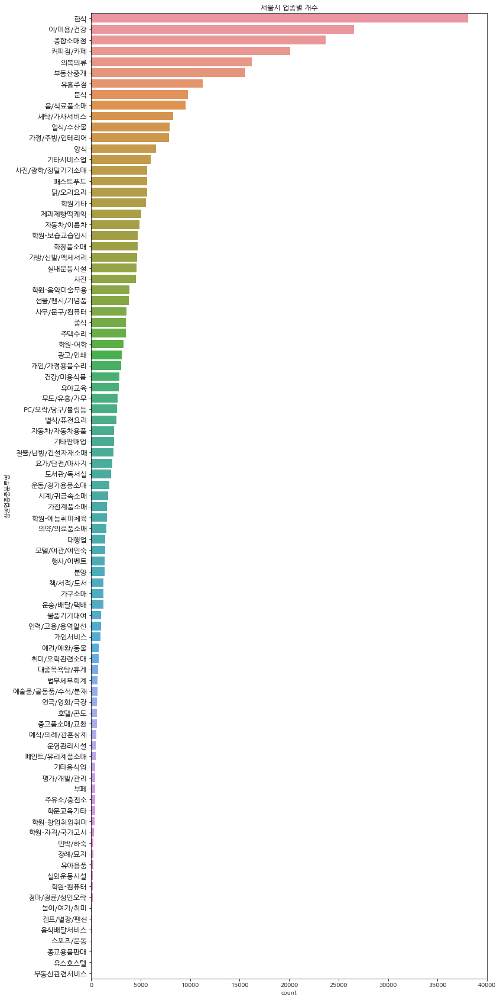

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumGothic'

plt.figure(figsize=(12, 30))
sns.countplot(y=seoul['상권업종중분류명'], order=seoul['상권업종중분류명'].value_counts().index)
plt.yticks(fontsize=12)
plt.title('서울시 업종별 개수')
plt.show()

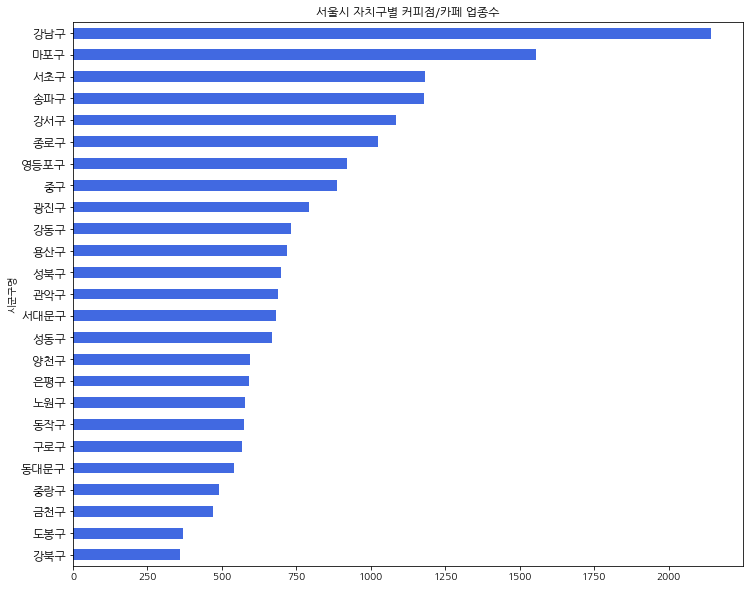

In [29]:
# 커피점/카페 업종은 자치구별로 어느 곳에 가장 많이 분포해 있는지 시각화

plt.figure(figsize=(12, 10))
seoul.loc[seoul['상권업종중분류명'] == '커피점/카페'].groupby('시군구명')['상권업종대분류명'].count()\
                                                     .sort_values().plot(kind='barh', color='royalblue')
plt.yticks(fontsize=12)
plt.title('서울시 자치구별 커피점/카페 업종수')
plt.show()

# 강남구가 가장 많은 수를 차지하고 강북구는 가장 적은 수를 차지하였습니다.

In [30]:
seoul_coffee = seoul.loc[seoul['상권업종중분류명'] == '커피점/카페']
seoul_coffee

,시군구명,상권업종대분류명,상권업종중분류명,위도,경도
20,종로구,음식,커피점/카페,37.583149,127.000171
96,도봉구,음식,커피점/카페,37.658728,127.034746
188,양천구,음식,커피점/카페,37.522055,126.842935
195,강서구,음식,커피점/카페,37.580941,126.813358
230,강남구,음식,커피점/카페,37.504378,127.054731
...,...,...,...,...,...
346118,영등포구,음식,커피점/카페,37.496691,126.897553
346138,용산구,음식,커피점/카페,37.532224,126.973108
346139,송파구,음식,커피점/카페,37.502219,127.107270
346162,노원구,음식,커피점/카페,37.665192,127.066524


In [31]:
m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=12, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

for lat, long in zip(seoul_coffee['위도'], seoul_coffee['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color="green")).add_to(marker_cluster)

m

In [32]:
seoul_group_data = seoul.loc[seoul['상권업종중분류명'] == '커피점/카페'].groupby('시군구명')['상권업종중분류명'].count()
seoul_group_data

시군구명
강남구     2141
강동구      733
강북구      359
강서구     1085
관악구      690
광진구      791
구로구      568
금천구      471
노원구      576
도봉구      371
동대문구     542
동작구      573
마포구     1556
서대문구     682
서초구     1183
성동구      667
성북구      698
송파구     1178
양천구      595
영등포구     921
용산구      720
은평구      590
종로구     1025
중구       885
중랑구      492
Name: 상권업종중분류명, dtype: int64

In [15]:
# choropleth 를 사용하여 시각화를 하면 업종 별 개수에 따른 색상의 차이를 두어 시각화를 해줍니다.

m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

m.choropleth(geo_data=seoul_geo,
             data=seoul_group_data, 
             fill_color='YlOrRd', # 색상 변경도 가능하다
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name="지역구별 커피 업종 수"
            )
m

NameError: name 'seoul_geo' is not defined

In [34]:
# bins를 만들어 1/4, 2/4, 3/4분위수별로 구간을 나누어 시각화할 수 있습니다.

bins = list(seoul_group_data.quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(
    location=[37.559819, 126.963895],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m)

m.choropleth(geo_data=seoul_geo,
             data=seoul_group_data, 
             fill_color='YlOrRd', # 색상 변경도 가능하다
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name="지역구별 커피 업종 수", 
             bins=bins
            )
m

In [36]:
# 저장은 save() 함수로 쉽게 html 파일로 저장할 수 있습니다.

m.save('map.html')